In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import torch
from datasets import Dataset, DatasetDict
from transformers import (AutoTokenizer, AutoConfig,
                          AutoModelForSequenceClassification,
                          TrainingArguments, Trainer)
from sklearn.metrics import (accuracy_score, precision_score,
                             recall_score, f1_score,
                             classification_report,
                             confusion_matrix, ConfusionMatrixDisplay)
from scipy.special import softmax
import matplotlib.pyplot as plt
import random
import shutil
import time
import os

print("✅ Libraries Imported Successfully!")

✅ Libraries Imported Successfully!


In [ ]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)
print("✅ Seed Set!")

✅ Seed Set!


In [ ]:
train_df = pd.read_excel('/content/drive/MyDrive/our-thesis-dataset-4 (80-10-10) (for BERT)/train-thesis-4-80.xlsx')
val_df   = pd.read_excel('/content/drive/MyDrive/our-thesis-dataset-4 (80-10-10) (for BERT)/val-thesis-4-10.xlsx')
test_df  = pd.read_excel('/content/drive/MyDrive/our-thesis-dataset-4 (80-10-10) (for BERT)/test-thesis-4-10.xlsx')

id2label = {0: 'Negative', 1: 'Neutral', 2: 'Positive'}
label2id = {'Negative': 0, 'Neutral': 1, 'Positive': 2}

for df in [train_df, val_df, test_df]:
    df['label'] = df['sentiment'].map(label2id)

train_df = train_df[['text', 'label']]
val_df   = val_df[['text', 'label']]
test_df  = test_df[['text', 'label']]

dataset = DatasetDict({
    'train': Dataset.from_pandas(train_df),
    'validation': Dataset.from_pandas(val_df),
    'test': Dataset.from_pandas(test_df)
})

print("✅ Data Loaded!")
print(f"   Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")

✅ Data Loaded!
   Train: 4800 | Val: 600 | Test: 600


In [ ]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    acc = accuracy_score(labels, predictions)
    f1  = f1_score(labels, predictions, average='weighted')
    return {'accuracy': acc, 'f1': f1}

print("✅ compute_metrics Ready!")

✅ compute_metrics Ready!


In [ ]:
def train_model(model_name, max_len, lr, epochs, batch_size):
    print(f"\n{'='*70}")
    print(f"🚀 Training: {model_name}")
    print(f"{'='*70}")

    set_seed(42)

    tokenizer = AutoTokenizer.from_pretrained(model_name)

    def tokenize_fn(examples):
        return tokenizer(examples['text'], truncation=True,
                         padding='max_length', max_length=max_len)

    tokenized = dataset.map(tokenize_fn, batched=True)

    config = AutoConfig.from_pretrained(
        model_name,
        num_labels=3,
        id2label=id2label,
        label2id=label2id
    )
    model = AutoModelForSequenceClassification.from_pretrained(
        model_name, config=config
    )

    safe_name = model_name.replace("/", "_")

    args = TrainingArguments(
        output_dir=f"./{safe_name}-ckpt",
        num_train_epochs=epochs,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        learning_rate=lr,
        warmup_steps=500,
        weight_decay=0.01,
        eval_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,        # ← 10 epoch শেষে best model load করবে
        metric_for_best_model="eval_accuracy",
        greater_is_better=True,             # ← accuracy বেশি হলে ভালো, তাই True
        logging_dir=f"./logs-{safe_name}",
        logging_steps=50,
        seed=42,
        fp16=True,
        report_to="none"
        # ← EarlyStoppingCallback নেই
    )

    trainer = Trainer(
        model=model,
        args=args,
        train_dataset=tokenized['train'],
        eval_dataset=tokenized['validation'],
        compute_metrics=compute_metrics
        # ← callbacks নেই
    )

    trainer.train()

    # ── Best Epoch Info ──
    log_history  = trainer.state.log_history
    best_val_acc = -1.0
    best_epoch   = 0
    best_val_loss = None

    for log in log_history:
        if 'eval_accuracy' in log:
            if log['eval_accuracy'] > best_val_acc:
                best_val_acc  = log['eval_accuracy']
                best_epoch    = int(log.get('epoch', 0))
                best_val_loss = log.get('eval_loss', None)

    print(f"\n   ✅ Best Epoch   : {best_epoch}")
    print(f"      Val Loss     : {best_val_loss:.4f}")
    print(f"      Val Accuracy : {best_val_acc*100:.2f}%")
    # if best_val_loss:
    #     print(f"      Val Loss     : {best_val_loss:.4f}")

    # ── Test Evaluation ──
    test_preds  = trainer.predict(tokenized['test'])
    true_labels = test_preds.label_ids
    pred_labels = np.argmax(test_preds.predictions, axis=-1)
    pred_probs  = softmax(test_preds.predictions, axis=-1)   # Soft Voting এর জন্য

    acc  = round(accuracy_score(true_labels, pred_labels) * 100, 2)
    prec = round(precision_score(true_labels, pred_labels, average='weighted') * 100, 2)
    rec  = round(recall_score(true_labels, pred_labels, average='weighted') * 100, 2)
    f1   = round(f1_score(true_labels, pred_labels, average='weighted') * 100, 2)

    print(f"\n📊 {model_name} — Test Results:")
    print(f"   Accuracy  : {acc}%")
    print(f"   Precision : {prec}%")
    print(f"   Recall    : {rec}%")
    print(f"   F1 Score  : {f1}%")

    # ── Checkpoint Delete ──
    ckpt_dir = f"./{safe_name}-ckpt"
    if os.path.exists(ckpt_dir):
        shutil.rmtree(ckpt_dir)
        print(f"🗑️  Checkpoint Deleted: {ckpt_dir}")

    return pred_labels, pred_probs, true_labels

print("✅ train_model() Ready!")

✅ train_model() Ready!


### Batch 16

In [ ]:
# batch 16

In [ ]:
# ── BanglaBERT ──
banglabert_preds, banglabert_probs, true_labels = train_model(
    model_name = "csebuetnlp/banglabert",
    max_len    = 32,
    lr         = 1e-5,
    epochs     = 10,
    batch_size = 16
)


🚀 Training: csebuetnlp/banglabert


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/119 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/528k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/443M [00:00<?, ?B/s]

ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
electra.embeddings.position_ids                   | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoi

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.682338,0.566562,0.880000,0.879072
2,0.286589,0.296450,0.920000,0.919602
3,0.185856,0.270711,0.920000,0.919612
4,0.146905,0.308090,0.928333,0.928504
5,0.087120,0.334402,0.923333,0.923356
6,0.073107,0.349280,0.930000,0.929910
7,0.047724,0.324719,0.935000,0.934940
8,0.053152,0.349356,0.930000,0.929857
9,0.029601,0.348175,0.933333,0.933351
10,0.052447,0.349552,0.935000,0.934997


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['electra.embeddings.LayerNorm.weight', 'electra.embeddings.LayerNorm.bias', 'electra.encoder.layer.0.attention.output.LayerNorm.weight', 'electra.encoder.layer.0.attention.output.LayerNorm.bias', 'electra.encoder.layer.0.output.LayerNorm.weight', 'electra.encoder.layer.0.output.LayerNorm.bias', 'electra.encoder.layer.1.attention.output.LayerNorm.weight', 'electra.encoder.layer.1.attention.output.LayerNorm.bias', 'electra.encoder.layer.1.output.LayerNorm.weight', 'electra.encoder.layer.1.output.LayerNorm.bias', 'electra.encoder.layer.2.attention.output.LayerNorm.weight', 'electra.encoder.layer.2.attention.output.LayerNorm.bias', 'electra.encoder.layer.2.output.LayerNorm.weight', 'electra.encoder.layer.2.output.LayerNorm.bias', 'electra.encoder.layer.3.attention.output.LayerNorm.weight', 'electra.encoder.layer.3.attention.output.LayerNorm.bias', 'electra.encoder.layer.3.output.LayerNorm.weight', 'electra.encoder.layer.3.output.Laye


   ✅ Best Epoch   : 7
      Val Loss     : 0.3247
      Val Accuracy : 93.50%



📊 csebuetnlp/banglabert — Test Results:
   Accuracy  : 94.83%
   Precision : 94.82%
   Recall    : 94.83%
   F1 Score  : 94.81%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-ckpt


In [ ]:
# ── BanglaBERT ──
banglabert_preds, banglabert_probs, true_labels = train_model(
    model_name = "csebuetnlp/banglabert",
    max_len    = 32,
    lr         = 2e-5,
    epochs     = 10,
    batch_size = 16
)


🚀 Training: csebuetnlp/banglabert


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/119 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/528k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
electra.embeddings.position_ids                   | UNEXPECTED | 
classifier.out_proj.bias                          | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.dense.weight                           | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoi

model.safetensors:   0%|          | 0.00/443M [00:00<?, ?B/s]

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.419556,0.369246,0.901667,0.900425
2,0.240280,0.244190,0.921667,0.921283
3,0.149002,0.246794,0.941667,0.941432
4,0.095605,0.296077,0.931667,0.931974
5,0.057293,0.339001,0.933333,0.933438
6,0.060007,0.330742,0.940000,0.939786
7,0.018389,0.342074,0.936667,0.936577
8,0.021187,0.393109,0.935000,0.934862
9,0.005481,0.391065,0.936667,0.936427
10,0.011677,0.407454,0.935000,0.934897


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['electra.embeddings.LayerNorm.weight', 'electra.embeddings.LayerNorm.bias', 'electra.encoder.layer.0.attention.output.LayerNorm.weight', 'electra.encoder.layer.0.attention.output.LayerNorm.bias', 'electra.encoder.layer.0.output.LayerNorm.weight', 'electra.encoder.layer.0.output.LayerNorm.bias', 'electra.encoder.layer.1.attention.output.LayerNorm.weight', 'electra.encoder.layer.1.attention.output.LayerNorm.bias', 'electra.encoder.layer.1.output.LayerNorm.weight', 'electra.encoder.layer.1.output.LayerNorm.bias', 'electra.encoder.layer.2.attention.output.LayerNorm.weight', 'electra.encoder.layer.2.attention.output.LayerNorm.bias', 'electra.encoder.layer.2.output.LayerNorm.weight', 'electra.encoder.layer.2.output.LayerNorm.bias', 'electra.encoder.layer.3.attention.output.LayerNorm.weight', 'electra.encoder.layer.3.attention.output.LayerNorm.bias', 'electra.encoder.layer.3.output.LayerNorm.weight', 'electra.encoder.layer.3.output.Laye


   ✅ Best Epoch   : 3
      Val Loss     : 0.2468
      Val Accuracy : 94.17%



📊 csebuetnlp/banglabert — Test Results:
   Accuracy  : 92.83%
   Precision : 93.15%
   Recall    : 92.83%
   F1 Score  : 92.73%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-ckpt


In [ ]:
# ── BanglaBERT ──
banglabert_preds, banglabert_probs, true_labels = train_model(
    model_name = "csebuetnlp/banglabert",
    max_len    = 32,
    lr         = 3e-5,
    epochs     = 10,
    batch_size = 16
)


🚀 Training: csebuetnlp/banglabert


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/119 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/528k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
electra.embeddings.position_ids                   | UNEXPECTED | 
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
classifier.out_proj.bias                          | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoi

model.safetensors:   0%|          | 0.00/443M [00:00<?, ?B/s]

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.336160,0.342876,0.896667,0.895090
2,0.223806,0.229437,0.921667,0.921478
3,0.146146,0.281651,0.935000,0.934601
4,0.070519,0.271065,0.940000,0.939977
5,0.068205,0.382307,0.928333,0.928284
6,0.045999,0.418330,0.930000,0.929963
7,0.019135,0.368956,0.935000,0.934930
8,0.018904,0.417146,0.928333,0.928248
9,0.003652,0.428442,0.928333,0.928203
10,0.008644,0.443891,0.930000,0.930049


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['electra.embeddings.LayerNorm.weight', 'electra.embeddings.LayerNorm.bias', 'electra.encoder.layer.0.attention.output.LayerNorm.weight', 'electra.encoder.layer.0.attention.output.LayerNorm.bias', 'electra.encoder.layer.0.output.LayerNorm.weight', 'electra.encoder.layer.0.output.LayerNorm.bias', 'electra.encoder.layer.1.attention.output.LayerNorm.weight', 'electra.encoder.layer.1.attention.output.LayerNorm.bias', 'electra.encoder.layer.1.output.LayerNorm.weight', 'electra.encoder.layer.1.output.LayerNorm.bias', 'electra.encoder.layer.2.attention.output.LayerNorm.weight', 'electra.encoder.layer.2.attention.output.LayerNorm.bias', 'electra.encoder.layer.2.output.LayerNorm.weight', 'electra.encoder.layer.2.output.LayerNorm.bias', 'electra.encoder.layer.3.attention.output.LayerNorm.weight', 'electra.encoder.layer.3.attention.output.LayerNorm.bias', 'electra.encoder.layer.3.output.LayerNorm.weight', 'electra.encoder.layer.3.output.Laye


   ✅ Best Epoch   : 4
      Val Loss     : 0.2711
      Val Accuracy : 94.00%



📊 csebuetnlp/banglabert — Test Results:
   Accuracy  : 94.33%
   Precision : 94.34%
   Recall    : 94.33%
   F1 Score  : 94.3%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-ckpt


### Batch 8

In [ ]:
# batch 8

In [ ]:
# ── BanglaBERT ──
banglabert_preds, banglabert_probs, true_labels = train_model(
    model_name = "csebuetnlp/banglabert",
    max_len    = 32,
    lr         = 1e-5,
    epochs     = 10,
    batch_size = 8
)


🚀 Training: csebuetnlp/banglabert


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/119 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/528k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/443M [00:00<?, ?B/s]

ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
electra.embeddings.position_ids                   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
classifier.out_proj.weight                        | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 
classifier.dense.weight                           | MISSING    | 
classifier.dense.bias                             | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoi

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.333358,0.320560,0.913333,0.912625
2,0.247477,0.295539,0.928333,0.928022
3,0.125664,0.342085,0.935000,0.934926
4,0.137707,0.412312,0.920000,0.920331
5,0.047417,0.399091,0.931667,0.931625
6,0.044941,0.390873,0.938333,0.938143
7,0.029476,0.440126,0.933333,0.933316
8,0.053967,0.458305,0.931667,0.931438
9,0.023081,0.479160,0.935000,0.934910
10,0.014197,0.483808,0.935000,0.934910


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['electra.embeddings.LayerNorm.weight', 'electra.embeddings.LayerNorm.bias', 'electra.encoder.layer.0.attention.output.LayerNorm.weight', 'electra.encoder.layer.0.attention.output.LayerNorm.bias', 'electra.encoder.layer.0.output.LayerNorm.weight', 'electra.encoder.layer.0.output.LayerNorm.bias', 'electra.encoder.layer.1.attention.output.LayerNorm.weight', 'electra.encoder.layer.1.attention.output.LayerNorm.bias', 'electra.encoder.layer.1.output.LayerNorm.weight', 'electra.encoder.layer.1.output.LayerNorm.bias', 'electra.encoder.layer.2.attention.output.LayerNorm.weight', 'electra.encoder.layer.2.attention.output.LayerNorm.bias', 'electra.encoder.layer.2.output.LayerNorm.weight', 'electra.encoder.layer.2.output.LayerNorm.bias', 'electra.encoder.layer.3.attention.output.LayerNorm.weight', 'electra.encoder.layer.3.attention.output.LayerNorm.bias', 'electra.encoder.layer.3.output.LayerNorm.weight', 'electra.encoder.layer.3.output.Laye


   ✅ Best Epoch   : 6
      Val Loss     : 0.3909
      Val Accuracy : 93.83%



📊 csebuetnlp/banglabert — Test Results:
   Accuracy  : 93.83%
   Precision : 93.87%
   Recall    : 93.83%
   F1 Score  : 93.76%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-ckpt


In [ ]:
# ── BanglaBERT ──
banglabert_preds, banglabert_probs, true_labels = train_model(
    model_name = "csebuetnlp/banglabert",
    max_len    = 32,
    lr         = 2e-5,
    epochs     = 10,
    batch_size = 8
)


🚀 Training: csebuetnlp/banglabert


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/119 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/528k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense.weight            | UNEXPECTED | 
electra.embeddings.position_ids                   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoi

model.safetensors:   0%|          | 0.00/443M [00:00<?, ?B/s]

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.326286,0.476853,0.871667,0.866859
2,0.241870,0.326364,0.921667,0.921376
3,0.159184,0.366344,0.930000,0.929847
4,0.097215,0.329595,0.928333,0.928162
5,0.028387,0.423294,0.935000,0.934847
6,0.023854,0.431549,0.930000,0.929947
7,0.009243,0.455202,0.931667,0.932033
8,0.008496,0.481620,0.933333,0.933291
9,0.001123,0.454680,0.931667,0.931681
10,0.011351,0.443476,0.931667,0.931450


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['electra.embeddings.LayerNorm.weight', 'electra.embeddings.LayerNorm.bias', 'electra.encoder.layer.0.attention.output.LayerNorm.weight', 'electra.encoder.layer.0.attention.output.LayerNorm.bias', 'electra.encoder.layer.0.output.LayerNorm.weight', 'electra.encoder.layer.0.output.LayerNorm.bias', 'electra.encoder.layer.1.attention.output.LayerNorm.weight', 'electra.encoder.layer.1.attention.output.LayerNorm.bias', 'electra.encoder.layer.1.output.LayerNorm.weight', 'electra.encoder.layer.1.output.LayerNorm.bias', 'electra.encoder.layer.2.attention.output.LayerNorm.weight', 'electra.encoder.layer.2.attention.output.LayerNorm.bias', 'electra.encoder.layer.2.output.LayerNorm.weight', 'electra.encoder.layer.2.output.LayerNorm.bias', 'electra.encoder.layer.3.attention.output.LayerNorm.weight', 'electra.encoder.layer.3.attention.output.LayerNorm.bias', 'electra.encoder.layer.3.output.LayerNorm.weight', 'electra.encoder.layer.3.output.Laye


   ✅ Best Epoch   : 5
      Val Loss     : 0.4233
      Val Accuracy : 93.50%



📊 csebuetnlp/banglabert — Test Results:
   Accuracy  : 95.83%
   Precision : 95.83%
   Recall    : 95.83%
   F1 Score  : 95.82%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-ckpt


In [ ]:
# ── BanglaBERT ──
banglabert_preds, banglabert_probs, true_labels = train_model(
    model_name = "csebuetnlp/banglabert",
    max_len    = 32,
    lr         = 3e-5,
    epochs     = 10,
    batch_size = 8
)


🚀 Training: csebuetnlp/banglabert


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/119 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/528k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/443M [00:00<?, ?B/s]

ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
electra.embeddings.position_ids                   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoi

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.323614,0.386769,0.896667,0.894563
2,0.219778,0.313689,0.921667,0.921397
3,0.128477,0.376220,0.910000,0.910068
4,0.050065,0.410738,0.935000,0.934906
5,0.031729,0.509867,0.928333,0.928203
6,0.027687,0.395718,0.936667,0.936369
7,0.014809,0.524939,0.928333,0.928550
8,0.059639,0.485959,0.930000,0.930081
9,0.001838,0.535592,0.928333,0.928399
10,0.007431,0.538004,0.931667,0.931675


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['electra.embeddings.LayerNorm.weight', 'electra.embeddings.LayerNorm.bias', 'electra.encoder.layer.0.attention.output.LayerNorm.weight', 'electra.encoder.layer.0.attention.output.LayerNorm.bias', 'electra.encoder.layer.0.output.LayerNorm.weight', 'electra.encoder.layer.0.output.LayerNorm.bias', 'electra.encoder.layer.1.attention.output.LayerNorm.weight', 'electra.encoder.layer.1.attention.output.LayerNorm.bias', 'electra.encoder.layer.1.output.LayerNorm.weight', 'electra.encoder.layer.1.output.LayerNorm.bias', 'electra.encoder.layer.2.attention.output.LayerNorm.weight', 'electra.encoder.layer.2.attention.output.LayerNorm.bias', 'electra.encoder.layer.2.output.LayerNorm.weight', 'electra.encoder.layer.2.output.LayerNorm.bias', 'electra.encoder.layer.3.attention.output.LayerNorm.weight', 'electra.encoder.layer.3.attention.output.LayerNorm.bias', 'electra.encoder.layer.3.output.LayerNorm.weight', 'electra.encoder.layer.3.output.Laye


   ✅ Best Epoch   : 6
      Val Loss     : 0.3957
      Val Accuracy : 93.67%



📊 csebuetnlp/banglabert — Test Results:
   Accuracy  : 94.67%
   Precision : 94.68%
   Recall    : 94.67%
   F1 Score  : 94.61%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-ckpt


### best model

---
model_name = "csebuetnlp/banglabert", <br>
    max_len    = 32, <br>
    lr         = 2e-5, <br>
    epochs     = 10, <br>
    batch_size = 8 <br>
---

✅ Best Epoch   : 5         <br>
    Val Loss     : 0.4233 <br>
    Val Accuracy : 93.50% <br>
---

📊 csebuetnlp/banglabert — Test Results:<br>
   Accuracy  : 95.83%<br>
   Precision : 95.83%<br>
   Recall    : 95.83%<br>
   F1 Score  : 95.82%<br>

---

In [ ]:
import torch
from transformers import TrainerCallback
from sklearn.metrics import accuracy_score
import numpy as np

class TrainAccuracyCallback(TrainerCallback):

    def __init__(self):
        self.trainer = None

    def set_trainer(self, trainer):
        self.trainer = trainer

    def on_epoch_end(self, args, state, control, **kwargs):

        if self.trainer is None:
            return

        model = self.trainer.model
        dataloader = self.trainer.get_train_dataloader()

        model.eval()

        all_preds = []
        all_labels = []

        with torch.no_grad():
            for batch in dataloader:

                batch = {k: v.to(model.device) for k, v in batch.items()}
                labels = batch.pop("labels")

                outputs = model(**batch)
                preds = outputs.logits.argmax(dim=-1).cpu().numpy()

                all_preds.extend(preds)
                all_labels.extend(labels.cpu().numpy())

        train_acc = accuracy_score(all_labels, all_preds)

        print(f"📊 Epoch {int(state.epoch)} - Training Accuracy: {train_acc*100:.2f}%")

        self.trainer.log({"train_accuracy": train_acc})


print("TrainAccuracyCallback Function Loaded Successfully !!")

TrainAccuracyCallback Function Loaded Successfully !!


In [ ]:
model_name = "csebuetnlp/banglabert"
max_len    = 32
lr         = 2e-5
epochs     = 10
batch_size = 8


print(f"\n{'='*70}")
print(f"🚀 Training: {model_name}")
print(f"{'='*70}")

set_seed(42)

tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize_fn(examples):
    return tokenizer(examples['text'], truncation=True,
                      padding='max_length', max_length=max_len)

tokenized = dataset.map(tokenize_fn, batched=True)

config = AutoConfig.from_pretrained(
    model_name,
    num_labels=3,
    id2label=id2label,
    label2id=label2id
)
model = AutoModelForSequenceClassification.from_pretrained(
    model_name, config=config
)

safe_name = model_name.replace("/", "_")

args = TrainingArguments(
    output_dir=f"./{safe_name}-ckpt",
    num_train_epochs=epochs,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    learning_rate=lr,
    warmup_steps=500,
    weight_decay=0.01,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,        # ← 10 epoch শেষে best model load করবে
    metric_for_best_model="eval_accuracy",
    greater_is_better=True,             # ← accuracy বেশি হলে ভালো, তাই True
    logging_dir=f"./logs-{safe_name}",
    logging_steps=50,
    seed=42,
    fp16=True,
    report_to="none"
    # ← EarlyStoppingCallback নেই
)

train_acc_callback = TrainAccuracyCallback()

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=tokenized['train'],
    eval_dataset=tokenized['validation'],
    compute_metrics=compute_metrics,
    callbacks=[
        # EarlyStoppingCallback(early_stopping_patience=1),
        train_acc_callback
    ]
    # ← callbacks নেই
)

train_acc_callback.set_trainer(trainer)

trainer.train()

# ── Best Epoch Info ──
log_history  = trainer.state.log_history
best_val_acc = -1.0
best_epoch   = 0
best_val_loss = None

for log in log_history:
    if 'eval_accuracy' in log:
        if log['eval_accuracy'] > best_val_acc:
            best_val_acc  = log['eval_accuracy']
            best_epoch    = int(log.get('epoch', 0))
            best_val_loss = log.get('eval_loss', None)

print(f"\n   ✅ Best Epoch   : {best_epoch}")
print(f"      Val Loss     : {best_val_loss:.4f}")
print(f"      Val Accuracy : {best_val_acc*100:.2f}%")
# if best_val_loss:
#     print(f"      Val Loss     : {best_val_loss:.4f}")

# ── Test Evaluation ──
test_preds  = trainer.predict(tokenized['test'])
true_labels = test_preds.label_ids
pred_labels = np.argmax(test_preds.predictions, axis=-1)
pred_probs  = softmax(test_preds.predictions, axis=-1)   # Soft Voting এর জন্য

acc  = round(accuracy_score(true_labels, pred_labels) * 100, 2)
prec = round(precision_score(true_labels, pred_labels, average='weighted') * 100, 2)
rec  = round(recall_score(true_labels, pred_labels, average='weighted') * 100, 2)
f1   = round(f1_score(true_labels, pred_labels, average='weighted') * 100, 2)

print(f"\n📊 {model_name} — Test Results:")
print(f"   Accuracy  : {acc}%")
print(f"   Precision : {prec}%")
print(f"   Recall    : {rec}%")
print(f"   F1 Score  : {f1}%")

# ── Checkpoint Delete ──
ckpt_dir = f"./{safe_name}-ckpt"
if os.path.exists(ckpt_dir):
    shutil.rmtree(ckpt_dir)
    print(f"🗑️  Checkpoint Deleted: {ckpt_dir}")

    # return pred_labels, pred_probs, true_labels

print("✅ train_model() Ready!")


🚀 Training: csebuetnlp/banglabert


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/119 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/528k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/443M [00:00<?, ?B/s]

ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense.weight            | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
electra.embeddings.position_ids                   | UNEXPECTED | 
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
classifier.out_proj.bias                          | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.weight                           | MISSING    | 
classifier.dense.bias                             | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoi

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.326286,0.476853,0.871667,0.866859
2,0.241870,0.326364,0.921667,0.921376
3,0.159184,0.366344,0.930000,0.929847
4,0.097215,0.329595,0.928333,0.928162
5,0.028387,0.423294,0.935000,0.934847
6,0.023854,0.431549,0.930000,0.929947
7,0.009243,0.455202,0.931667,0.932033
8,0.008496,0.481620,0.933333,0.933291
9,0.001123,0.454680,0.931667,0.931681
10,0.011351,0.443476,0.931667,0.931450


📊 Epoch 1 - Training Accuracy: 89.00%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

📊 Epoch 2 - Training Accuracy: 97.58%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

📊 Epoch 3 - Training Accuracy: 98.60%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

📊 Epoch 4 - Training Accuracy: 99.40%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

📊 Epoch 5 - Training Accuracy: 99.62%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

📊 Epoch 6 - Training Accuracy: 99.75%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

📊 Epoch 7 - Training Accuracy: 99.75%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

📊 Epoch 8 - Training Accuracy: 99.81%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

📊 Epoch 9 - Training Accuracy: 99.85%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

📊 Epoch 10 - Training Accuracy: 99.88%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['electra.embeddings.LayerNorm.weight', 'electra.embeddings.LayerNorm.bias', 'electra.encoder.layer.0.attention.output.LayerNorm.weight', 'electra.encoder.layer.0.attention.output.LayerNorm.bias', 'electra.encoder.layer.0.output.LayerNorm.weight', 'electra.encoder.layer.0.output.LayerNorm.bias', 'electra.encoder.layer.1.attention.output.LayerNorm.weight', 'electra.encoder.layer.1.attention.output.LayerNorm.bias', 'electra.encoder.layer.1.output.LayerNorm.weight', 'electra.encoder.layer.1.output.LayerNorm.bias', 'electra.encoder.layer.2.attention.output.LayerNorm.weight', 'electra.encoder.layer.2.attention.output.LayerNorm.bias', 'electra.encoder.layer.2.output.LayerNorm.weight', 'electra.encoder.layer.2.output.LayerNorm.bias', 'electra.encoder.layer.3.attention.output.LayerNorm.weight', 'electra.encoder.layer.3.attention.output.LayerNorm.bias', 'electra.encoder.layer.3.output.LayerNorm.weight', 'electra.encoder.layer.3.output.Laye


   ✅ Best Epoch   : 5
      Val Loss     : 0.4233
      Val Accuracy : 93.50%



📊 csebuetnlp/banglabert — Test Results:
   Accuracy  : 95.83%
   Precision : 95.83%
   Recall    : 95.83%
   F1 Score  : 95.82%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-ckpt
✅ train_model() Ready!


### Accuracy Curve

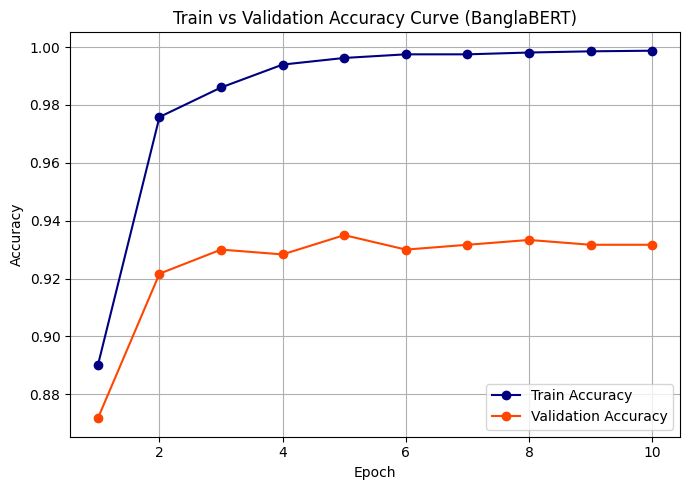

In [ ]:
train_acc = []
val_acc = []
epochs = []

for log in trainer.state.log_history:

    if 'train_accuracy' in log:
        train_acc.append(log['train_accuracy'])

    if 'eval_accuracy' in log:
        val_acc.append(log['eval_accuracy'])
        epochs.append(log['epoch'])

# Plot
plt.figure(figsize=(7,5))

plt.plot(epochs, train_acc[:len(epochs)], marker='o', label="Train Accuracy", color='navy')
plt.plot(epochs, val_acc, marker='o', label="Validation Accuracy", color='orangered')

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Train vs Validation Accuracy Curve (BanglaBERT)")

plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig("BanglaBERT_train_val_accuracy_curve_95per.png", dpi=300)

plt.show()

### Loss Curve

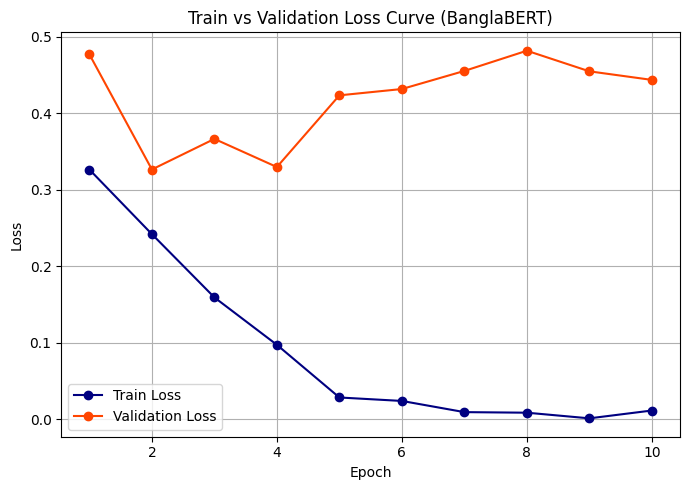

In [ ]:
train_loss = []
val_loss = []
epochs = []

last_train_loss = None

for log in trainer.state.log_history:

    if 'loss' in log:
        last_train_loss = log['loss']

    if 'eval_loss' in log:
        val_loss.append(log['eval_loss'])
        train_loss.append(last_train_loss)
        epochs.append(log['epoch'])

plt.figure(figsize=(7,5))

plt.plot(epochs, train_loss, marker='o', label="Train Loss", color='navy')
plt.plot(epochs, val_loss, marker='o', label="Validation Loss", color='orangered')

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train vs Validation Loss Curve (BanglaBERT)")

plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig("BanglaBERT_train_val_loss_curve_95per.png", dpi=300)

plt.show()

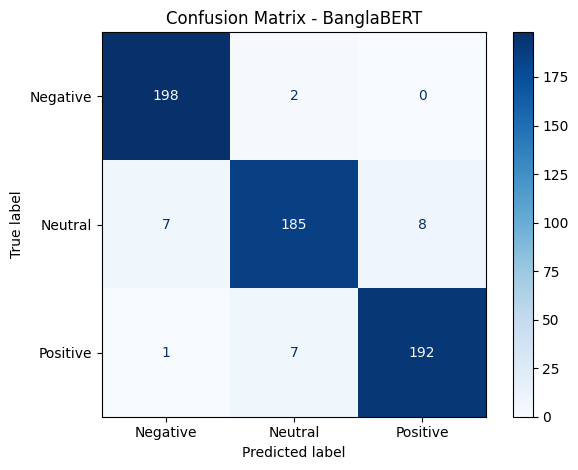

In [ ]:
ConfusionMatrixDisplay.from_predictions(
    true_labels,
    pred_labels,
    display_labels=['Negative','Neutral','Positive'],
    cmap='Blues'
)

plt.title("Confusion Matrix - BanglaBERT")

plt.tight_layout()
plt.savefig("BanglaBERT_confusion_matrix_95per.png", dpi=300)

plt.show()

In [ ]:
# ====================== CLASSIFICATION REPORT ======================
from sklearn.metrics import classification_report

print("\n" + "="*60)
print("Classification Report (BanglaBERT):")
print("="*60)

# Detailed classification report
report = classification_report(
    true_labels,
    pred_labels,
    target_names=['Negative', 'Neutral', 'Positive'],
    digits=2,
    output_dict=False
)

print(report)


Classification Report (BanglaBERT):
              precision    recall  f1-score   support

    Negative       0.96      0.99      0.98       200
     Neutral       0.95      0.93      0.94       200
    Positive       0.96      0.96      0.96       200

    accuracy                           0.96       600
   macro avg       0.96      0.96      0.96       600
weighted avg       0.96      0.96      0.96       600



### Class wise performance metrics

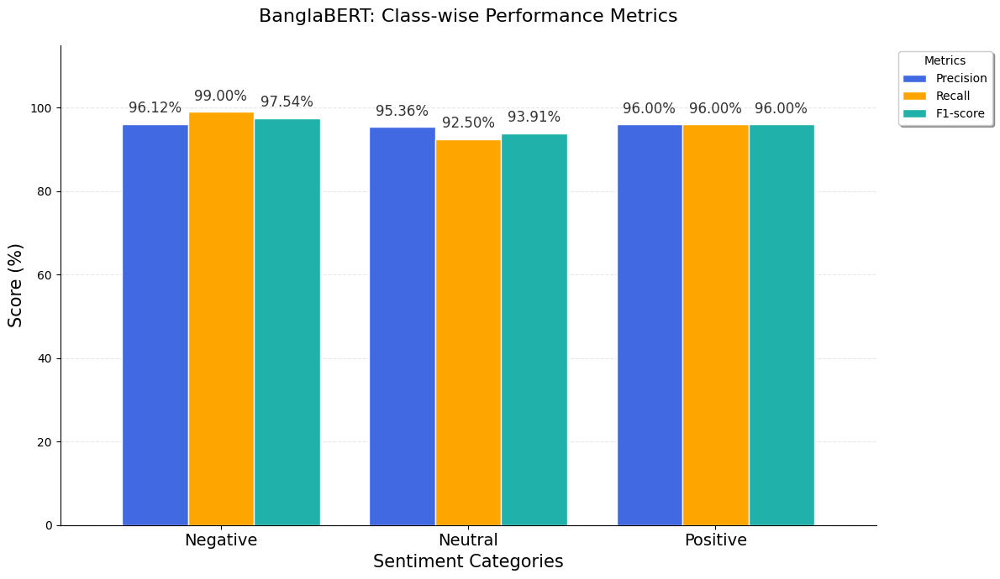

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import classification_report

# 1. Report data preparation
report_dict = classification_report(
    true_labels,
    pred_labels,
    target_names=['Negative', 'Neutral', 'Positive'],
    output_dict=True
)

classes = ['Negative', 'Neutral', 'Positive']
metrics = ['precision', 'recall', 'f1-score']
data = {metric.capitalize(): [report_dict[cls][metric] * 100 for cls in classes] for metric in metrics}
df_plot = pd.DataFrame(data, index=classes)

# 2. Plotting with New Colors
# Professional Palette: Deep Teal, Soft Coral, and Muted Gold
# custom_colors = ['#008080', '#F08080', '#FFD700']
custom_colors = ['royalblue', 'orange', 'lightseagreen']

fig, ax = plt.subplots(figsize=(12, 7))
df_plot.plot(kind='bar', ax=ax, width=0.8, color=custom_colors, edgecolor='white', linewidth=1)

# 3. Bar-er upore percentage text (Ektu clean korlam)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom',
                xytext=(0, 7),
                textcoords='offset points',
                fontsize=12 , color='#333333')

# 4. Styling & Outside Legend
plt.title('BanglaBERT: Class-wise Performance Metrics', fontsize=16, pad=20)
plt.ylabel('Score (%)', fontsize=15)
plt.xlabel('Sentiment Categories', fontsize=15)
plt.xticks(rotation=0, fontsize=14)
plt.ylim(0, 115)

# Legend-ke box-er baire placement (Right Side)
ax.legend(title="Metrics",
          loc='upper left',
          bbox_to_anchor=(1.02, 1),
          frameon=True,
          fancybox=True,
          shadow=True,
          fontsize=10)

# Background styling
ax.yaxis.grid(True, linestyle='--', alpha=0.3)
ax.set_axisbelow(True) # Grid line bar-er niche thakbe
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()

# Save image (Bbox_inches use kora hoyeche jate legend kete na jay)
plt.savefig("BanglaBERT_Class_Wise_Performance_95per.png", dpi=300, bbox_inches='tight')
plt.show()

### ROC CURVE

Loading tokenizer and model...
Using GPU
Loading test data...
Running inference on test set...


  0%|          | 0/75 [00:00<?, ?it/s]

Collected 600 predictions

═════════════════════════════════════════════════════════════════
ROC-AUC (Test Set - Best Model)
─────────────────────────────────────────────────────────────────
Negative AUC : 0.9955
Neutral  AUC : 0.9833
Positive AUC : 0.9945
Macro  AUC   : 0.9922
Micro  AUC   : 0.9906
═════════════════════════════════════════════════════════════════



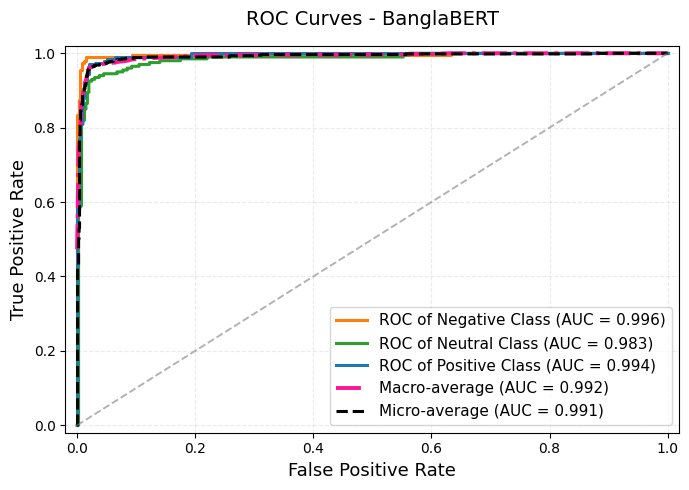

Plot saved as: roc_auc_bangaBERT.png


In [ ]:
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from torch.utils.data import DataLoader, Dataset
from tqdm.auto import tqdm

# ─── Config ────────────────────────────────────────────────────────
# MODEL_PATH = "/content/best_model_maxlen_60"          # ← এখানে তোমার best model এর path দাও
TEST_FILE  = "/content/drive/MyDrive/our-thesis-dataset-4 (80-10-10) (for BERT)/test-thesis-4-10.xlsx"
MAX_LENGTH = 32
BATCH_SIZE = 8

label2id = {'Negative': 0, 'Neutral': 1, 'Positive': 2}
id2label = {0: 'Negative', 1: 'Neutral', 2: 'Positive'}
NUM_CLASSES = 3

# ─── 1. Load model & tokenizer ─────────────────────────────────────
print("Loading tokenizer and model...")
# tokenizer = AutoTokenizer.from_pretrained(MODEL_PATH)
# model = AutoModelForSequenceClassification.from_pretrained(MODEL_PATH)
model.eval()

if torch.cuda.is_available():
    model.cuda()
    device = torch.device("cuda")
    print("Using GPU")
else:
    device = torch.device("cpu")
    print("Using CPU")

# ─── 2. Load test data ─────────────────────────────────────────────
print("Loading test data...")
test_df = pd.read_excel(TEST_FILE)
test_df = test_df[['text', 'sentiment']].copy()
test_df['label'] = test_df['sentiment'].map(label2id)
test_df = test_df.dropna(subset=['label'])
test_df['label'] = test_df['label'].astype(int)

true_labels = test_df['label'].values

# ─── 3. Custom Dataset ─────────────────────────────────────────────
class TextDataset(Dataset):
    def __init__(self, texts, labels=None):
        self.texts = texts
        self.labels = labels

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        item = {'text': self.texts[idx]}
        if self.labels is not None:
            item['label'] = self.labels[idx]
        return item

def collate_fn(batch):
    texts = [item['text'] for item in batch]
    encodings = tokenizer(
        texts,
        truncation=True,
        padding=True,
        max_length=MAX_LENGTH,
        return_tensors='pt'
    )
    if 'label' in batch[0]:
        labels = torch.tensor([item['label'] for item in batch])
        return {**encodings, 'labels': labels}
    return encodings

test_dataset = TextDataset(test_df['text'].tolist(), test_df['label'].tolist())
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)

# ─── 4. Get predictions (probabilities) ────────────────────────────
all_probs = []
all_labels = []

print("Running inference on test set...")
with torch.no_grad():
    for batch in tqdm(test_loader):
        batch = {k: v.to(device) for k, v in batch.items()}
        labels = batch.pop('labels')

        outputs = model(**batch)
        probs = torch.softmax(outputs.logits, dim=-1).cpu().numpy()

        all_probs.append(probs)
        all_labels.append(labels.cpu().numpy())

all_probs = np.concatenate(all_probs, axis=0)
true_labels = np.concatenate(all_labels, axis=0)

print(f"Collected {len(true_labels)} predictions")

# ─── 5. ROC + AUC calculation ──────────────────────────────────────
true_onehot = label_binarize(true_labels, classes=[0, 1, 2])

fpr = {}
tpr = {}
roc_auc = {}

for i in range(NUM_CLASSES):
    fpr[i], tpr[i], _ = roc_curve(true_onehot[:, i], all_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Macro-average
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(NUM_CLASSES)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(NUM_CLASSES):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= NUM_CLASSES

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Micro-average
fpr["micro"], tpr["micro"], _ = roc_curve(true_onehot.ravel(), all_probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# ─── 6. Print AUC ──────────────────────────────────────────────────
print("\n" + "═"*65)
print("ROC-AUC (Test Set - Best Model)")
print("─"*65)
print(f"Negative AUC : {roc_auc[0]:.4f}")
print(f"Neutral  AUC : {roc_auc[1]:.4f}")
print(f"Positive AUC : {roc_auc[2]:.4f}")
print(f"Macro  AUC   : {roc_auc['macro']:.4f}")
print(f"Micro  AUC   : {roc_auc['micro']:.4f}")
print("═"*65 + "\n")

# ─── 7. Plot ───────────────────────────────────────────────────────
plt.figure(figsize=(7, 5))

colors = ['#ff7f0e', '#2ca02c', '#1f77b4']
class_names = ['Negative', 'Neutral', 'Positive']

for i, color in enumerate(colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2.2,
             label=f'ROC of {class_names[i]} Class (AUC = {roc_auc[i]:.3f})')

plt.plot(fpr["macro"], tpr["macro"],
         color='deeppink', lw=2.8, linestyle='-.',
         label=f'Macro-average (AUC = {roc_auc["macro"]:.3f})')

plt.plot(fpr["micro"], tpr["micro"],
         color='black', lw=2.2, linestyle='--',
         label=f'Micro-average (AUC = {roc_auc["micro"]:.3f})')

plt.plot([0, 1], [0, 1], color='gray', lw=1.4, linestyle='--', alpha=0.6)

plt.xlim([-0.02, 1.02])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate', fontsize=13)
plt.ylabel('True Positive Rate', fontsize=13)
plt.title('ROC Curves - BanglaBERT', fontsize=14, pad=15)
plt.legend(loc='lower right', fontsize=11, frameon=True)
plt.grid(True, alpha=0.25, linestyle='--')
plt.tight_layout()

plt.savefig("roc_auc_banglaBERT_95per.png", dpi=300, bbox_inches='tight')
plt.show()

print("Plot saved as: roc_auc_bangaBERT_per.png")

### SHAP

Valid texts loaded: 600
SHAP Explainer তৈরি হচ্ছে...
SHAP values compute করা হচ্ছে...


PartitionExplainer explainer: 601it [05:59,  1.65it/s]


SHAP values computed!


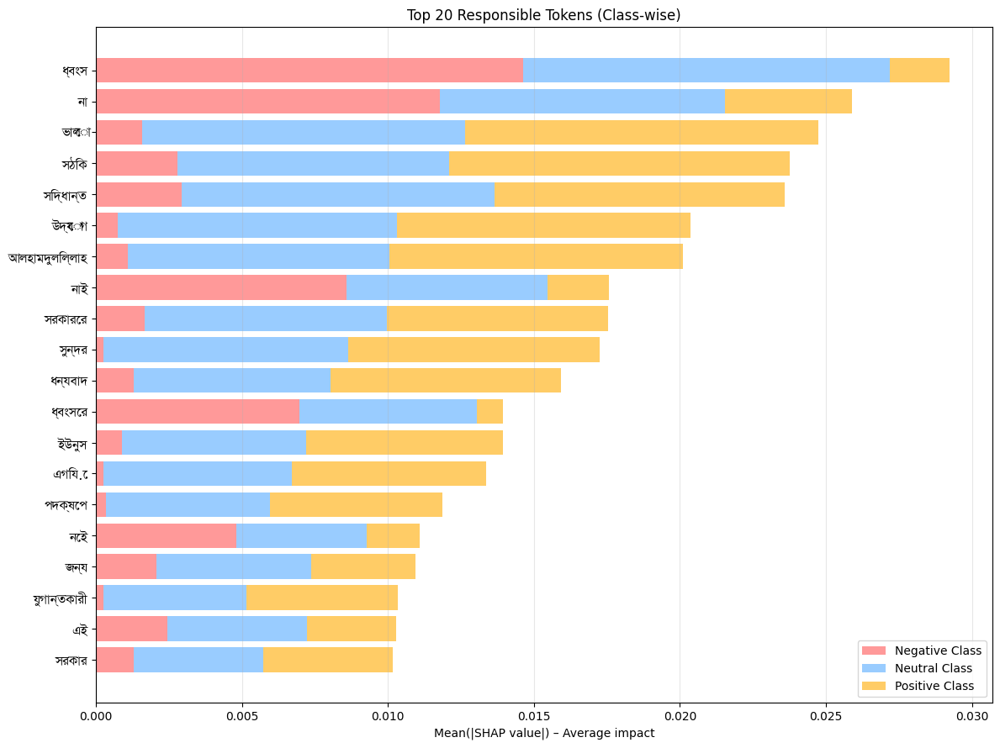

In [ ]:
import shap
import torch
import numpy as np
import pandas as pd
import matplotlib.font_manager as fm
from collections import defaultdict
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# ফন্ট সেট করো
font_path = "/content/drive/MyDrive/SolaimanLipi.ttf"
prop = fm.FontProperties(fname=font_path)

# =====================================
# Config
# =====================================
# MODEL_PATH = "/content/best_model_maxlen_60"
TEST_FILE  = "/content/drive/MyDrive/our-thesis-dataset-4 (80-10-10) (for BERT)/test-thesis-4-10.xlsx"
MAX_LEN    = 32

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class_names = ["Negative", "Neutral", "Positive"]

# =====================================
# Load model & tokenizer
# =====================================
# tokenizer = AutoTokenizer.from_pretrained(MODEL_PATH)
# model = AutoModelForSequenceClassification.from_pretrained(MODEL_PATH)
model.to(DEVICE)
model.eval()

# =====================================
# Prediction function
# =====================================
def predict_fn(texts):
    if isinstance(texts, str):
        texts = [texts]
    # ফিল্টার: খালি/শুধু স্পেস string বাদ দাও
    texts = [t.strip() for t in texts if isinstance(t, str) and t.strip()]
    if not texts:
        return np.zeros((0, 3))  # empty case
    inputs = tokenizer(
        texts,
        padding=True,
        truncation=True,
        max_length=MAX_LEN,
        return_tensors="pt"
    )
    inputs = {k: v.to(DEVICE) for k, v in inputs.items()}
    with torch.no_grad():
        logits = model(**inputs).logits
    return torch.softmax(logits, dim=-1).cpu().numpy()

# =====================================
# Load & clean test texts
# =====================================
df = pd.read_excel(TEST_FILE)
df = df.dropna(subset=["text"])                  # NaN row বাদ
df["text"] = df["text"].astype(str).str.strip()  # string + strip
df = df[df["text"] != ""]                        # খালি string বাদ
df = df[df["text"] != "nan"]

# texts = df["text"].tolist()[:150]                # ১৫০টা নাও (বাড়াতে পারো)
texts = df["text"].tolist()[:]

print(f"Valid texts loaded: {len(texts)}")
if len(texts) == 0:
    print("কোনো valid text নেই! ডেটা চেক করো।")
    # exit() বা raise error

# =====================================
# SHAP setup
# =====================================
print("SHAP Explainer তৈরি হচ্ছে...")
masker = shap.maskers.Text(tokenizer)
explainer = shap.Explainer(predict_fn, masker)

print("SHAP values compute করা হচ্ছে...")
# shap_values = explainer(texts[:50])   # প্রথমে ৫০টা দিয়ে টেস্ট করো (ধীরে ধীরে বাড়াও)
shap_values = explainer(texts[:])

print("SHAP values computed!")

# =====================================
# Aggregate token importance (clean)
# =====================================
token_contrib = defaultdict(lambda: np.zeros(3))

for i in range(len(shap_values.data)):
    tokens = shap_values.data[i]
    values = shap_values.values[i]  # shape: (seq_len, 3)

    for j, token in enumerate(tokens):
        clean_token = token.replace("##", "").strip()
        if clean_token in ["[CLS]", "[SEP]", "[PAD]", "", "▁", " "]:
            continue
        token_contrib[clean_token] += np.abs(values[j])

# Average
for token in token_contrib:
    token_contrib[token] /= len(texts)

# Top 20
token_total = {t: contrib.sum() for t, contrib in token_contrib.items()}
top_tokens = sorted(token_total, key=token_total.get, reverse=True)[:20]

neg = [token_contrib[t][0] for t in top_tokens]
neu = [token_contrib[t][1] for t in top_tokens]
pos = [token_contrib[t][2] for t in top_tokens]

# =====================================
# Plot
# =====================================
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 9))
y_pos = np.arange(len(top_tokens))

plt.barh(y_pos, neg, color='#FF9999', label='Negative Class')
plt.barh(y_pos, neu, left=neg, color='#99CCFF', label='Neutral Class')
plt.barh(y_pos, pos, left=np.array(neg)+np.array(neu), color='#FFCC66', label='Positive Class')

# প্লটিং-এর সময় yticks-এ prop ব্যবহার করো
plt.yticks(y_pos, top_tokens, fontproperties=prop, fontsize=11)
plt.xlabel("Mean(|SHAP value|) – Average impact")
plt.title("Top 20 Responsible Tokens (Class-wise)")
plt.legend()
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.savefig("shap_plot_95per.png", dpi=300, bbox_inches='tight')
plt.show()

### Missclassified samples

In [ ]:
# Calculate the number of correct and incorrect predictions
correct_predictions = np.sum(true_labels == pred_labels)
incorrect_predictions = np.sum(true_labels != pred_labels)

# Or, using the length of misclassified_indices from previous cell
# incorrect_predictions = len(misclassified_indices)

total_samples = len(true_labels)

print(f"\nTest Data Prediction Summary:")
print(f"{'='*35}")
print(f"Total Test Samples: {total_samples}")
print(f"Correctly Identified: {correct_predictions}")
print(f"Incorrectly Identified: {incorrect_predictions}")
print(f"Accuracy: {correct_predictions / total_samples * 100:.2f}%")


Test Data Prediction Summary:
Total Test Samples: 600
Correctly Identified: 575
Incorrectly Identified: 25
Accuracy: 95.83%


In [ ]:
# Identify misclassified predictions
misclassified_indices = np.where(true_labels != pred_labels)[0]

misclassified_df = test_df.iloc[misclassified_indices].copy()
misclassified_df['predicted_label'] = pred_labels[misclassified_indices]
misclassified_df['true_label'] = true_labels[misclassified_indices]

# Map numerical labels back to original sentiment names for better readability
misclassified_df['true_sentiment'] = misclassified_df['true_label'].map(id2label)
misclassified_df['predicted_sentiment'] = misclassified_df['predicted_label'].map(id2label)

# Select and reorder columns for display and saving
misclassified_display_df = misclassified_df[['text', 'true_sentiment', 'predicted_sentiment']]

print("\nMisclassified Predictions:")
print("="*30)
print(f"Total Misclassifications: {len(misclassified_display_df)}\n")
print(misclassified_display_df.head())

# Save the misclassified predictions to an Excel file
output_path = "misclassified_predictions.xlsx"
misclassified_display_df.to_excel(output_path, index=False)
print(f"\n✅ Misclassified predictions saved to {output_path}")


Misclassified Predictions:
Total Misclassifications: 25

                                                  text true_sentiment  \
50   স্যার আপনার সাথে বিএনপির ভারপ্রাপ্ত চেয়ারম্যা...        Neutral   
61   বর্তমান পরিস্থিতিতে একমাস মূল্যায়ন করার জন্য ...        Neutral   
82   পারিবারিক দিবসকে স্বৈরাচার রাষ্ট্রীয় দিবস বান...        Neutral   
98                          দ্রুত বাস্তবায়ন চাই স্যার       Positive   
117      জাতীয় স্টেডিয়ামে চাঁদাবাজি একটু খেয়াল করেন       Negative   

    predicted_sentiment  
50             Positive  
61             Negative  
82             Negative  
98              Neutral  
117             Neutral  

✅ Misclassified predictions saved to misclassified_predictions.xlsx


In [ ]:
# Define a directory to save the model and tokenizer
save_directory = "./saved_banglabert_model"

# Create the directory if it doesn't exist
if not os.path.exists(save_directory):
    os.makedirs(save_directory)

# Save the model
model.save_pretrained(save_directory)

# Save the tokenizer
tokenizer.save_pretrained(save_directory)

print(f"✅ Model and tokenizer saved to: {save_directory}")

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

✅ Model and tokenizer saved to: ./saved_banglabert_model


### LIME

In [ ]:
!pip install lime --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
# best_model_path = f'/content/best_model_maxlen_60'
best_max_len=32

import torch
import numpy as np
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# ১. আপনার বেস্ট মডেল এবং টোকেনাইজার লোড করুন
# 'best_model_path' আপনার লুপ থেকে পাওয়া পাথটি ব্যবহার করুন
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = AutoModelForSequenceClassification.from_pretrained(best_model_path).to(device)
# tokenizer = AutoTokenizer.from_pretrained(best_model_path)

# ২. প্রেডিকশন ফাংশন (যা LIME এর জন্য প্রসেসড আউটপুট দিবে)
def predictor(texts):
    # টোকেনাইজেশন
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=best_max_len).to(device)

    # মডেল প্রেডিকশন
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        # Softmax দিয়ে প্রবাবিলিটি বের করা
        probs = torch.nn.functional.softmax(logits, dim=-1)

    return probs.cpu().numpy()

# ৩. LIME Explainer সেটআপ
# আপনার label2id অনুযায়ী ক্লাস নামগুলো সাজানো হয়েছে
class_names = ['Negative', 'Neutral', 'Positive']



explainer = LimeTextExplainer(
    class_names=class_names,
    split_expression=r'\s+',               # স্পেস দিয়ে শব্দ আলাদা → বাংলার জন্য ভালো
    # যদি আরও ভালো টোকেনাইজার চাও তাহলে bnunicodenormalizer বা custom function দিতে পারো
)



# ৪. একটি স্যাম্পল টেক্সট এর ওপর ব্যাখ্যা জেনারেট করুন
# আপনি চাইলে test_df থেকে যেকোনো একটি টেক্সট নিতে পারেন
# idx = 0 # test set এর কত নাম্বার রো চেক করবেন
# sample_text = test_df.iloc[idx]['text']



# # sample_idx = 4 # negative label=0
# sample_idx = 31 # neutral label=1
# # sample_idx = 0 # positive label=2

# sample_text = test_df['text'].iloc[sample_idx]
# actual_sentiment = test_df['label'].iloc[sample_idx]


# print(f"Explaining instance: {sample_text}")
# print(f"Actual Sentiment: {id2label[actual_sentiment]}")



# ১. একটি স্যাম্পল ইনডেক্স বেছে নিন (যেমন test_df থেকে ৫ নম্বর সারি)
idx = 160
sample_text = test_df.iloc[idx]['text']
actual_label_id = test_df.iloc[idx]['label']
actual_label_name = id2label[actual_label_id]

# ২. মডেল থেকে প্রেডিকশন নিন
# predictor ফাংশনটি আগের কোড থেকে ব্যবহার করা হচ্ছে
probs = predictor([sample_text])
predicted_label_id = np.argmax(probs)
predicted_label_name = id2label[predicted_label_id]

# ৩. সুন্দর করে প্রিন্ট করুন
print(f"{'='*100}")
print(f"Text: {sample_text}")
print(f"Actual Label: {actual_label_name}")
print(f"Predicted Label: {predicted_label_name}")
print(f"Confidence: {np.max(probs)*100:.2f}%")
print(f"{'='*100}\n")



exp = explainer.explain_instance(
    sample_text,
    predictor,
    num_features=5, # কয়টি শব্দ বা টোকেন হাইলাইট করবে
    num_samples=5000,  # কতবার মডেলকে শাফেল করে চেক করবে (বেশি দিলে সময় বেশি লাগবে কিন্তু রেজাল্ট ভালো আসবে)
    labels=[predicted_label_id]
)



# ৫. রেজাল্ট ডিসপ্লে
exp.show_in_notebook(text=True)

Text: সরকারের যুগোপযোগী পদক্ষেপগুলো দেশের অর্থনীতিকে আরও শক্তিশালী করবে যা সকলের জন্য কল্যাণ বয়ে আনবে
Actual Label: Positive
Predicted Label: Positive
Confidence: 99.94%



In [ ]:
# best_model_path = f'/content/best_model_maxlen_60'
best_max_len=32

import torch
import numpy as np
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# ১. আপনার বেস্ট মডেল এবং টোকেনাইজার লোড করুন
# 'best_model_path' আপনার লুপ থেকে পাওয়া পাথটি ব্যবহার করুন
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = AutoModelForSequenceClassification.from_pretrained(best_model_path).to(device)
# tokenizer = AutoTokenizer.from_pretrained(best_model_path)

# ২. প্রেডিকশন ফাংশন (যা LIME এর জন্য প্রসেসড আউটপুট দিবে)
def predictor(texts):
    # টোকেনাইজেশন
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=best_max_len).to(device)

    # মডেল প্রেডিকশন
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        # Softmax দিয়ে প্রবাবিলিটি বের করা
        probs = torch.nn.functional.softmax(logits, dim=-1)

    return probs.cpu().numpy()

# ৩. LIME Explainer সেটআপ
# আপনার label2id অনুযায়ী ক্লাস নামগুলো সাজানো হয়েছে
class_names = ['Negative', 'Neutral', 'Positive']



explainer = LimeTextExplainer(
    class_names=class_names,
    split_expression=r'\s+',               # স্পেস দিয়ে শব্দ আলাদা → বাংলার জন্য ভালো
    # যদি আরও ভালো টোকেনাইজার চাও তাহলে bnunicodenormalizer বা custom function দিতে পারো
)



# ৪. একটি স্যাম্পল টেক্সট এর ওপর ব্যাখ্যা জেনারেট করুন
# আপনি চাইলে test_df থেকে যেকোনো একটি টেক্সট নিতে পারেন
# idx = 0 # test set এর কত নাম্বার রো চেক করবেন
# sample_text = test_df.iloc[idx]['text']



# # sample_idx = 4 # negative label=0
# sample_idx = 31 # neutral label=1
# # sample_idx = 0 # positive label=2

# sample_text = test_df['text'].iloc[sample_idx]
# actual_sentiment = test_df['label'].iloc[sample_idx]


# print(f"Explaining instance: {sample_text}")
# print(f"Actual Sentiment: {id2label[actual_sentiment]}")



# ১. একটি স্যাম্পল ইনডেক্স বেছে নিন (যেমন test_df থেকে ৫ নম্বর সারি)
idx = 42
sample_text = test_df.iloc[idx]['text']
actual_label_id = test_df.iloc[idx]['label']
actual_label_name = id2label[actual_label_id]

# ২. মডেল থেকে প্রেডিকশন নিন
# predictor ফাংশনটি আগের কোড থেকে ব্যবহার করা হচ্ছে
probs = predictor([sample_text])
predicted_label_id = np.argmax(probs)
predicted_label_name = id2label[predicted_label_id]

# ৩. সুন্দর করে প্রিন্ট করুন
print(f"{'='*100}")
print(f"Text: {sample_text}")
print(f"Actual Label: {actual_label_name}")
print(f"Predicted Label: {predicted_label_name}")
print(f"Confidence: {np.max(probs)*100:.2f}%")
print(f"{'='*100}\n")



exp = explainer.explain_instance(
    sample_text,
    predictor,
    num_features=5, # কয়টি শব্দ বা টোকেন হাইলাইট করবে
    num_samples=5000,  # কতবার মডেলকে শাফেল করে চেক করবে (বেশি দিলে সময় বেশি লাগবে কিন্তু রেজাল্ট ভালো আসবে)
    labels=[predicted_label_id]
)



# ৫. রেজাল্ট ডিসপ্লে
exp.show_in_notebook(text=True)

Text: সরকারের ভুল নীতির কারণে দ্রব্যমূল্য বাড়ছে যা সাধারণ মানুষের জীবনকে দুর্বিষহ করে তুলেছে
Actual Label: Negative
Predicted Label: Negative
Confidence: 99.55%



In [ ]:
# best_model_path = f'/content/best_model_maxlen_60'
best_max_len=32

import torch
import numpy as np
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# ১. আপনার বেস্ট মডেল এবং টোকেনাইজার লোড করুন
# 'best_model_path' আপনার লুপ থেকে পাওয়া পাথটি ব্যবহার করুন
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = AutoModelForSequenceClassification.from_pretrained(best_model_path).to(device)
# tokenizer = AutoTokenizer.from_pretrained(best_model_path)

# ২. প্রেডিকশন ফাংশন (যা LIME এর জন্য প্রসেসড আউটপুট দিবে)
def predictor(texts):
    # টোকেনাইজেশন
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=best_max_len).to(device)

    # মডেল প্রেডিকশন
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        # Softmax দিয়ে প্রবাবিলিটি বের করা
        probs = torch.nn.functional.softmax(logits, dim=-1)

    return probs.cpu().numpy()

# ৩. LIME Explainer সেটআপ
# আপনার label2id অনুযায়ী ক্লাস নামগুলো সাজানো হয়েছে
class_names = ['Negative', 'Neutral', 'Positive']



explainer = LimeTextExplainer(
    class_names=class_names,
    split_expression=r'\s+',               # স্পেস দিয়ে শব্দ আলাদা → বাংলার জন্য ভালো
    # যদি আরও ভালো টোকেনাইজার চাও তাহলে bnunicodenormalizer বা custom function দিতে পারো
)



# ৪. একটি স্যাম্পল টেক্সট এর ওপর ব্যাখ্যা জেনারেট করুন
# আপনি চাইলে test_df থেকে যেকোনো একটি টেক্সট নিতে পারেন
# idx = 0 # test set এর কত নাম্বার রো চেক করবেন
# sample_text = test_df.iloc[idx]['text']



# # sample_idx = 4 # negative label=0
# sample_idx = 31 # neutral label=1
# # sample_idx = 0 # positive label=2

# sample_text = test_df['text'].iloc[sample_idx]
# actual_sentiment = test_df['label'].iloc[sample_idx]


# print(f"Explaining instance: {sample_text}")
# print(f"Actual Sentiment: {id2label[actual_sentiment]}")



# ১. একটি স্যাম্পল ইনডেক্স বেছে নিন (যেমন test_df থেকে ৫ নম্বর সারি)
# idx = 415
# idx = 521
# idx = 594
idx = 184
sample_text = test_df.iloc[idx]['text']
actual_label_id = test_df.iloc[idx]['label']
actual_label_name = id2label[actual_label_id]

# ২. মডেল থেকে প্রেডিকশন নিন
# predictor ফাংশনটি আগের কোড থেকে ব্যবহার করা হচ্ছে
probs = predictor([sample_text])
predicted_label_id = np.argmax(probs)
predicted_label_name = id2label[predicted_label_id]



words = sample_text.split()

# মোট শব্দের 2/3 হিসাব
split_idx = int(len(words) * (2/3))

# প্রথম লাইনের text (Text: এর সাথে)
line1 = " ".join(words[:split_idx])

# দ্বিতীয় লাইনের text
line2 = " ".join(words[split_idx:])

# print(f"Text: {line1}")
# print(f"{line2}")


# ৩. সুন্দর করে প্রিন্ট করুন
print(f"{'='*100}")
print(f"Text: {line1}")
print(f"{line2}")
print(f"Actual Label: {actual_label_name}")
print(f"Predicted Label: {predicted_label_name}")
print(f"Confidence: {np.max(probs)*100:.2f}%")
print(f"{'='*100}\n")



exp = explainer.explain_instance(
    sample_text,
    predictor,
    num_features=5, # কয়টি শব্দ বা টোকেন হাইলাইট করবে
    num_samples=5000,  # কতবার মডেলকে শাফেল করে চেক করবে (বেশি দিলে সময় বেশি লাগবে কিন্তু রেজাল্ট ভালো আসবে)
    labels=[predicted_label_id]
)



# ৫. রেজাল্ট ডিসপ্লে
exp.show_in_notebook(text=True)

Text: বছরের অনিয়ম দুর্নীতি অরাজকতা জুলুম নির্যাতন থেকে পরিত্রাণ পাওয়ার পর নতুন সরকার মাসে কতটুকু কি করতে
পারবে সময় হলেই বুঝা যাবে সঠিক নাকি ভুল পথে
Actual Label: Neutral
Predicted Label: Neutral
Confidence: 61.88%



### TIME Complexity - BanglaBERT

In [ ]:
def get_folder_size_mb(folder_path):
    total_size = 0
    for dirpath, dirnames, filenames in os.walk(folder_path):
        for filename in filenames:
            filepath = os.path.join(dirpath, filename)
            if os.path.exists(filepath):
                total_size += os.path.getsize(filepath)
    return total_size / (1024 ** 2)


def train_model(model_name, max_len, lr, epochs, batch_size):
    print(f"\n{'='*70}")
    print(f"🚀 Training: {model_name}")
    print(f"{'='*70}")

    set_seed(42)

    tokenizer = AutoTokenizer.from_pretrained(model_name)

    def tokenize_fn(examples):
        return tokenizer(examples['text'], truncation=True,
                         padding='max_length', max_length=max_len)

    tokenized = dataset.map(tokenize_fn, batched=True)

    config = AutoConfig.from_pretrained(
        model_name,
        num_labels=3,
        id2label=id2label,
        label2id=label2id
    )
    model = AutoModelForSequenceClassification.from_pretrained(
        model_name, config=config
    )

    safe_name = model_name.replace("/", "_")

    args = TrainingArguments(
        output_dir=f"./{safe_name}-ckpt",
        num_train_epochs=epochs,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        learning_rate=lr,
        warmup_steps=500,
        weight_decay=0.01,
        eval_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,        # ← 10 epoch শেষে best model load করবে
        metric_for_best_model="eval_accuracy",
        greater_is_better=True,             # ← accuracy বেশি হলে ভালো, তাই True
        logging_dir=f"./logs-{safe_name}",
        logging_steps=50,
        seed=42,
        fp16=True,
        report_to="none"
        # ← EarlyStoppingCallback নেই
    )

    trainer = Trainer(
        model=model,
        args=args,
        train_dataset=tokenized['train'],
        eval_dataset=tokenized['validation'],
        compute_metrics=compute_metrics
        # ← callbacks নেই
    )



    # ── Training Time & GPU Memory ──
    if torch.cuda.is_available():
        torch.cuda.reset_peak_memory_stats()
        torch.cuda.synchronize()

    train_start = time.time()

    trainer.train()

    if torch.cuda.is_available():
        torch.cuda.synchronize()

    train_end = time.time()

    training_time = train_end - train_start

    if torch.cuda.is_available():
        memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)
    else:
        memory_usage = 0

    print(f"\n⏱️ Training Time: {training_time:.4f} seconds")
    print(f"🧠 Peak GPU Memory Usage: {memory_usage:.4f} MB")



    # ── Best Epoch Info ──
    log_history  = trainer.state.log_history
    best_val_acc = -1.0
    best_epoch   = 0
    best_val_loss = None

    for log in log_history:
        if 'eval_accuracy' in log:
            if log['eval_accuracy'] > best_val_acc:
                best_val_acc  = log['eval_accuracy']
                best_epoch    = int(log.get('epoch', 0))
                best_val_loss = log.get('eval_loss', None)

    print(f"\n   ✅ Best Epoch   : {best_epoch}")
    print(f"      Val Loss     : {best_val_loss:.4f}")
    print(f"      Val Accuracy : {best_val_acc*100:.2f}%")
    # if best_val_loss:
    #     print(f"      Val Loss     : {best_val_loss:.4f}")


    # ── Inference Time & Throughput ──
    if torch.cuda.is_available():
        torch.cuda.synchronize()

    infer_start = time.time()

    test_preds = trainer.predict(tokenized['test'])

    if torch.cuda.is_available():
        torch.cuda.synchronize()

    infer_end = time.time()

    total_inference_time = infer_end - infer_start
    num_test_samples = len(tokenized['test'])

    inference_time_ms = (total_inference_time / num_test_samples) * 1000
    throughput = num_test_samples / total_inference_time

    true_labels = test_preds.label_ids
    pred_labels = np.argmax(test_preds.predictions, axis=-1)
    pred_probs  = softmax(test_preds.predictions, axis=-1)

    print(f"\n⏱️ Total Inference Time: {total_inference_time:.4f} seconds")
    print(f"⚡ Inference Time: {inference_time_ms:.4f} ms/sample")
    print(f"🚀 Throughput: {throughput:.4f} samples/s")



    acc  = round(accuracy_score(true_labels, pred_labels) * 100, 2)
    prec = round(precision_score(true_labels, pred_labels, average='weighted') * 100, 2)
    rec  = round(recall_score(true_labels, pred_labels, average='weighted') * 100, 2)
    f1   = round(f1_score(true_labels, pred_labels, average='weighted') * 100, 2)

    print(f"\n📊 {model_name} — Test Results:")
    print(f"   Accuracy  : {acc}%")
    print(f"   Precision : {prec}%")
    print(f"   Recall    : {rec}%")
    print(f"   F1 Score  : {f1}%")



    # ── Model Size ──
    saved_model_dir = f"./{safe_name}-final-model"

    trainer.save_model(saved_model_dir)
    tokenizer.save_pretrained(saved_model_dir)

    model_size = get_folder_size_mb(saved_model_dir)

    print(f"💾 Model Size: {model_size:.4f} MB")


    complexity_result = {
        "Training Time (s)": round(training_time, 4),
        "Inference Time (ms/sample)": round(inference_time_ms, 4),
        "Throughput (samples/s)": round(throughput, 4),
        "Memory Usage (MB)": round(memory_usage, 4),
        "Model Size (MB)": round(model_size, 4)
    }

    complexity_df = pd.DataFrame(
        [complexity_result],
        index=[model_name]
    )

    print("\nComputational Complexity Result:")
    print(complexity_df)


    # ── Checkpoint Delete ──
    ckpt_dir = f"./{safe_name}-ckpt"
    if os.path.exists(ckpt_dir):
        shutil.rmtree(ckpt_dir)
        print(f"🗑️  Checkpoint Deleted: {ckpt_dir}")

    return pred_labels, pred_probs, true_labels, complexity_result

print("✅ train_model() Ready!")

✅ train_model() Ready!


In [ ]:
banglabert_preds, banglabert_probs, true_labels, banglabert_complexity = train_model(
    model_name = "csebuetnlp/banglabert",
    max_len    = 32,
    lr         = 2e-5,
    epochs     = 10,
    batch_size = 8
)


🚀 Training: csebuetnlp/banglabert


config.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/119 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/528k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
electra.embeddings.position_ids                   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoi

model.safetensors:   0%|          | 0.00/443M [00:00<?, ?B/s]

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.326286,0.476853,0.871667,0.866859
2,0.241870,0.326364,0.921667,0.921376
3,0.159184,0.366344,0.930000,0.929847
4,0.097215,0.329595,0.928333,0.928162
5,0.028387,0.423294,0.935000,0.934847
6,0.023854,0.431549,0.930000,0.929947
7,0.009243,0.455202,0.931667,0.932033
8,0.008496,0.481620,0.933333,0.933291
9,0.001123,0.454680,0.931667,0.931681
10,0.011351,0.443476,0.931667,0.931450


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['electra.embeddings.LayerNorm.weight', 'electra.embeddings.LayerNorm.bias', 'electra.encoder.layer.0.attention.output.LayerNorm.weight', 'electra.encoder.layer.0.attention.output.LayerNorm.bias', 'electra.encoder.layer.0.output.LayerNorm.weight', 'electra.encoder.layer.0.output.LayerNorm.bias', 'electra.encoder.layer.1.attention.output.LayerNorm.weight', 'electra.encoder.layer.1.attention.output.LayerNorm.bias', 'electra.encoder.layer.1.output.LayerNorm.weight', 'electra.encoder.layer.1.output.LayerNorm.bias', 'electra.encoder.layer.2.attention.output.LayerNorm.weight', 'electra.encoder.layer.2.attention.output.LayerNorm.bias', 'electra.encoder.layer.2.output.LayerNorm.weight', 'electra.encoder.layer.2.output.LayerNorm.bias', 'electra.encoder.layer.3.attention.output.LayerNorm.weight', 'electra.encoder.layer.3.attention.output.LayerNorm.bias', 'electra.encoder.layer.3.output.LayerNorm.weight', 'electra.encoder.layer.3.output.Laye


⏱️ Training Time: 777.9181 seconds
🧠 Peak GPU Memory Usage: 1712.9160 MB

   ✅ Best Epoch   : 5
      Val Loss     : 0.4233
      Val Accuracy : 93.50%



⏱️ Total Inference Time: 1.1926 seconds
⚡ Inference Time: 1.9877 ms/sample
🚀 Throughput: 503.1022 samples/s

📊 csebuetnlp/banglabert — Test Results:
   Accuracy  : 95.83%
   Precision : 95.83%
   Recall    : 95.83%
   F1 Score  : 95.82%


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

💾 Model Size: 422.9941 MB

Computational Complexity Result:
                       Training Time (s)  Inference Time (ms/sample)  \
csebuetnlp/banglabert           777.9181                      1.9877   

                       Throughput (samples/s)  Memory Usage (MB)  \
csebuetnlp/banglabert                503.1022           1712.916   

                       Model Size (MB)  
csebuetnlp/banglabert         422.9941  
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-ckpt


In [ ]:
banglabert_complexity_df = pd.DataFrame(
    [banglabert_complexity],
    index=["BanglaBERT"]
)

print(banglabert_complexity_df)

            Training Time (s)  Inference Time (ms/sample)  \
BanglaBERT           777.9181                      1.9877   

            Throughput (samples/s)  Memory Usage (MB)  Model Size (MB)  
BanglaBERT                503.1022           1712.916         422.9941  


### 10 Fold Cross Validation

In [ ]:
# সব split একসাথে করো
full_df = pd.concat([train_df, val_df, test_df], ignore_index=True)
full_df = full_df.reset_index(drop=True)

print(f"✅ Full Dataset Combined: {len(full_df)} samples")
print(full_df['label'].value_counts())

✅ Full Dataset Combined: 6000 samples
label
2    2000
1    2000
0    2000
Name: count, dtype: int64


In [ ]:
from sklearn.model_selection import StratifiedKFold

def run_cross_validation(
    model_name,
    full_df,
    n_folds=5,
    max_len=32,
    lr=2e-5,
    epochs=10,
    batch_size=8,
    seed=42
):
    set_seed(seed)
    safe_name = model_name.replace("/", "_")

    # ── Outer KFold: Test split ──
    skf_outer = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=seed)

    # ── Inner KFold: Val split (trainval থেকে) ──
    # ✅ CORRECTION 1: আগে arbitrary 10% নিতাম
    # এখন StratifiedKFold দিয়ে properly split করছি
    skf_inner = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=seed)

    fold_results = []

    for fold_idx, (trainval_idx, test_idx) in enumerate(
            skf_outer.split(full_df['text'], full_df['label'])):

        print(f"\n{'='*70}")
        print(f"  FOLD {fold_idx+1} / {n_folds}  —  {model_name}")
        print(f"{'='*70}")

        # ── Outer Split ──
        fold_trainval = full_df.iloc[trainval_idx].reset_index(drop=True)
        fold_test     = full_df.iloc[test_idx].reset_index(drop=True)

        # ── Inner Split ──
        # ✅ CORRECTION 2: প্রথম inner fold নিচ্ছি
        # এতে label distribution maintain হয়, shuffle হয়
        for train_idx, val_idx in skf_inner.split(
                fold_trainval['text'], fold_trainval['label']):
            fold_train = fold_trainval.iloc[train_idx].reset_index(drop=True)
            fold_val   = fold_trainval.iloc[val_idx].reset_index(drop=True)
            break  # শুধু প্রথম inner fold দরকার

        print(f"   Train : {len(fold_train)} ({len(fold_train)/len(full_df)*100:.1f}%)")
        print(f"   Val   : {len(fold_val)}   ({len(fold_val)/len(full_df)*100:.1f}%)")
        print(f"   Test  : {len(fold_test)}  ({len(fold_test)/len(full_df)*100:.1f}%)")

        # ── Dataset ──
        fold_dataset = DatasetDict({
            'train':      Dataset.from_pandas(fold_train),
            'validation': Dataset.from_pandas(fold_val),
            'test':       Dataset.from_pandas(fold_test),
        })

        # ── Tokenize ──
        tokenizer = AutoTokenizer.from_pretrained(model_name)

        def tokenize_fn(examples):
            return tokenizer(
                examples['text'],
                truncation=True,
                padding='max_length',
                max_length=max_len
            )

        tokenized = fold_dataset.map(tokenize_fn, batched=True)

        # ── Model ──
        config = AutoConfig.from_pretrained(
            model_name,
            num_labels=3,
            id2label=id2label,
            label2id=label2id
        )
        model = AutoModelForSequenceClassification.from_pretrained(
            model_name, config=config
        )

        # ── Training Args ──
        ckpt_dir = f"./{safe_name}-fold{fold_idx+1}-ckpt"

        args = TrainingArguments(
            output_dir=ckpt_dir,
            num_train_epochs=epochs,
            per_device_train_batch_size=batch_size,
            per_device_eval_batch_size=batch_size,
            learning_rate=lr,
            warmup_steps=200,
            weight_decay=0.01,
            eval_strategy="epoch",
            save_strategy="epoch",
            load_best_model_at_end=True,
            metric_for_best_model="eval_accuracy",
            greater_is_better=True,
            logging_dir=f"./logs-{safe_name}-fold{fold_idx+1}",
            logging_steps=50,
            seed=seed,
            fp16=True,
            report_to="none"
        )

        trainer = Trainer(
            model=model,
            args=args,
            train_dataset=tokenized['train'],
            eval_dataset=tokenized['validation'],
            compute_metrics=compute_metrics,
        )

        trainer.train()

        # ── Best Epoch Info ──
        log_history  = trainer.state.log_history
        best_val_acc = -1.0
        best_epoch   = 0

        for log in log_history:
            if 'eval_accuracy' in log:
                if log['eval_accuracy'] > best_val_acc:
                    best_val_acc = log['eval_accuracy']
                    best_epoch   = int(log.get('epoch', 0))

        print(f"   ✅ Best Epoch : {best_epoch}  |  Val Acc: {best_val_acc*100:.2f}%")

        # ── Test Evaluation ──
        test_preds  = trainer.predict(tokenized['test'])
        true_labels = test_preds.label_ids
        pred_labels = np.argmax(test_preds.predictions, axis=-1)

        acc  = round(accuracy_score(true_labels, pred_labels)                        * 100, 2)
        prec = round(precision_score(true_labels, pred_labels, average='weighted')   * 100, 2)
        rec  = round(recall_score(true_labels, pred_labels, average='weighted')      * 100, 2)
        f1   = round(f1_score(true_labels, pred_labels, average='weighted')          * 100, 2)

        print(f"\n📊 Fold {fold_idx+1} Test Results:")
        print(f"   Accuracy  : {acc}%")
        print(f"   Precision : {prec}%")
        print(f"   Recall    : {rec}%")
        print(f"   F1 Score  : {f1}%")

        fold_results.append({
            'fold':      fold_idx + 1,
            'accuracy':  acc,
            'precision': prec,
            'recall':    rec,
            'f1':        f1,
        })

        # ── Cleanup ──
        if os.path.exists(ckpt_dir):
            shutil.rmtree(ckpt_dir)
            print(f"🗑️  Checkpoint Deleted: {ckpt_dir}")

        del model, trainer
        torch.cuda.empty_cache()

    return fold_results

In [ ]:
N_FOLDS    = 10          # ← 10 করলে 10-Fold হবে
MODEL_NAME = "csebuetnlp/banglabert"

results = run_cross_validation(
    model_name = MODEL_NAME,
    full_df    = full_df,
    n_folds    = N_FOLDS,
    max_len    = 32,
    lr         = 2e-5,
    epochs     = 10,
    batch_size = 8,
    seed       = 42
)


  FOLD 1 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.301827,0.230181,0.940741,0.940508
2,0.276400,0.287220,0.924074,0.923904
3,0.100358,0.315587,0.937037,0.936563
4,0.051575,0.318302,0.946296,0.946436
5,0.007729,0.358219,0.944444,0.944440
6,0.004334,0.378476,0.946296,0.946426
7,0.010145,0.461007,0.940741,0.940912
8,0.024126,0.451418,0.938889,0.939196
9,0.013306,0.439412,0.946296,0.946482
10,0.033084,0.446645,0.938889,0.938807


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 4  |  Val Acc: 94.63%



📊 Fold 1 Test Results:
   Accuracy  : 94.0%
   Precision : 94.03%
   Recall    : 94.0%
   F1 Score  : 93.98%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold1-ckpt

  FOLD 2 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.349535,0.288395,0.916667,0.916546
2,0.235902,0.446543,0.905556,0.903518
3,0.063814,0.427956,0.931481,0.931268
4,0.042292,0.371097,0.929630,0.929452
5,0.031539,0.481178,0.925926,0.925376
6,0.044714,0.507730,0.925926,0.926021
7,0.017397,0.512959,0.931481,0.931385
8,0.019312,0.519525,0.929630,0.929899
9,0.000213,0.570185,0.929630,0.929516
10,0.000185,0.562219,0.931481,0.931394


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 3  |  Val Acc: 93.15%



📊 Fold 2 Test Results:
   Accuracy  : 93.17%
   Precision : 93.16%
   Recall    : 93.17%
   F1 Score  : 93.15%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold2-ckpt

  FOLD 3 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.354375,0.293273,0.922222,0.921277
2,0.201949,0.337296,0.918519,0.917239
3,0.129623,0.344681,0.929630,0.929592
4,0.083941,0.455994,0.924074,0.924844
5,0.019920,0.393978,0.940741,0.940750
6,0.043477,0.473583,0.931481,0.931346
7,0.010565,0.498151,0.935185,0.935273
8,0.000246,0.477926,0.938889,0.938919
9,0.005347,0.522837,0.937037,0.937009
10,0.001681,0.527759,0.937037,0.937009


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 5  |  Val Acc: 94.07%



📊 Fold 3 Test Results:
   Accuracy  : 95.17%
   Precision : 95.17%
   Recall    : 95.17%
   F1 Score  : 95.13%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold3-ckpt

  FOLD 4 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.302826,0.289387,0.905556,0.905630
2,0.197513,0.378530,0.916667,0.916378
3,0.080851,0.398566,0.925926,0.926017
4,0.044424,0.532669,0.920370,0.920288
5,0.042184,0.589283,0.924074,0.923909
6,0.046045,0.601407,0.925926,0.925923
7,0.054129,0.603436,0.925926,0.925947
8,0.002958,0.620286,0.925926,0.926046
9,0.000195,0.672679,0.927778,0.927699
10,0.035149,0.676482,0.925926,0.925863


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 9  |  Val Acc: 92.78%



📊 Fold 4 Test Results:
   Accuracy  : 94.33%
   Precision : 94.37%
   Recall    : 94.33%
   F1 Score  : 94.32%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold4-ckpt

  FOLD 5 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.310309,0.341258,0.909259,0.909485
2,0.122245,0.368417,0.927778,0.927746
3,0.108668,0.467200,0.912963,0.913314
4,0.116398,0.502207,0.914815,0.915107
5,0.063636,0.549540,0.920370,0.920312
6,0.052381,0.475245,0.931481,0.931625
7,0.000339,0.587967,0.922222,0.922261
8,0.012852,0.593593,0.924074,0.924116
9,0.006916,0.612373,0.924074,0.923832
10,0.000204,0.618182,0.925926,0.925994


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 6  |  Val Acc: 93.15%



📊 Fold 5 Test Results:
   Accuracy  : 93.67%
   Precision : 93.73%
   Recall    : 93.67%
   F1 Score  : 93.68%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold5-ckpt

  FOLD 6 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.333119,0.357435,0.909259,0.908408
2,0.227645,0.405952,0.909259,0.909161
3,0.179710,0.490823,0.901852,0.901741
4,0.049526,0.462481,0.927778,0.927867
5,0.038231,0.518519,0.920370,0.920536
6,0.015546,0.534939,0.925926,0.925781
7,0.006411,0.560370,0.925926,0.925776
8,0.000268,0.565975,0.927778,0.928186
9,0.001870,0.571081,0.927778,0.927854
10,0.022072,0.573624,0.929630,0.929729


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 10  |  Val Acc: 92.96%



📊 Fold 6 Test Results:
   Accuracy  : 92.33%
   Precision : 92.38%
   Recall    : 92.33%
   F1 Score  : 92.34%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold6-ckpt

  FOLD 7 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.376410,0.337087,0.901852,0.899905
2,0.212148,0.335766,0.927778,0.927333
3,0.178579,0.376719,0.925926,0.926083
4,0.037791,0.449524,0.924074,0.923114
5,0.079912,0.488731,0.924074,0.924319
6,0.035433,0.493297,0.929630,0.929720
7,0.000395,0.528776,0.925926,0.925889
8,0.007237,0.551943,0.927778,0.927866
9,0.013459,0.539220,0.933333,0.933281
10,0.005108,0.559215,0.929630,0.929672


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 9  |  Val Acc: 93.33%



📊 Fold 7 Test Results:
   Accuracy  : 94.67%
   Precision : 94.67%
   Recall    : 94.67%
   F1 Score  : 94.67%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold7-ckpt

  FOLD 8 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.336842,0.269143,0.922222,0.921555
2,0.161508,0.307869,0.929630,0.929364
3,0.090629,0.314265,0.938889,0.939060
4,0.050404,0.355383,0.935185,0.934693
5,0.037875,0.420270,0.938889,0.938244
6,0.016083,0.565355,0.924074,0.923083
7,0.005697,0.396839,0.942593,0.942503
8,0.017901,0.494831,0.935185,0.934408
9,0.014591,0.481644,0.935185,0.934557
10,0.002230,0.458579,0.937037,0.936608


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 7  |  Val Acc: 94.26%



📊 Fold 8 Test Results:
   Accuracy  : 92.33%
   Precision : 92.42%
   Recall    : 92.33%
   F1 Score  : 92.36%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold8-ckpt

  FOLD 9 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.275462,0.210352,0.953704,0.953693
2,0.237805,0.253500,0.946296,0.945485
3,0.140385,0.292485,0.938889,0.938674
4,0.118060,0.245466,0.950000,0.949788
5,0.092567,0.372115,0.935185,0.934495
6,0.019904,0.352797,0.938889,0.938651
7,0.013986,0.343404,0.950000,0.949677
8,0.014685,0.357551,0.946296,0.945845
9,0.000396,0.379033,0.944444,0.944038
10,0.000233,0.375666,0.946296,0.945930


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 1  |  Val Acc: 95.37%



📊 Fold 9 Test Results:
   Accuracy  : 92.17%
   Precision : 92.14%
   Recall    : 92.17%
   F1 Score  : 92.11%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold9-ckpt

  FOLD 10 / 10  —  csebuetnlp/banglabert
   Train : 4860 (81.0%)
   Val   : 540   (9.0%)
   Test  : 600  (10.0%)


Map:   0%|          | 0/4860 [00:00<?, ? examples/s]

Map:   0%|          | 0/540 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] ElectraForSequenceClassification LOAD REPORT from: csebuetnlp/banglabert
Key                                               | Status     | 
--------------------------------------------------+------------+-
discriminator_predictions.dense_prediction.weight | UNEXPECTED | 
discriminator_predictions.dense_prediction.bias   | UNEXPECTED | 
discriminator_predictions.dense.bias              | UNEXPECTED | 
discriminator_predictions.dense.weight            | UNEXPECTED | 
classifier.dense.weight                           | MISSING    | 
classifier.out_proj.weight                        | MISSING    | 
classifier.dense.bias                             | MISSING    | 
classifier.out_proj.bias                          | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.
[tra

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.309407,0.313506,0.914815,0.915488
2,0.240564,0.328426,0.918519,0.918984
3,0.058675,0.569907,0.901852,0.902401
4,0.106980,0.376559,0.931481,0.930879
5,0.041105,0.420461,0.935185,0.934545
6,0.009709,0.390457,0.942593,0.942366
7,0.009866,0.485740,0.935185,0.935181
8,0.000753,0.501429,0.929630,0.929958
9,0.005794,0.551021,0.931481,0.931563
10,0.000194,0.521058,0.933333,0.933463


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

   ✅ Best Epoch : 6  |  Val Acc: 94.26%



📊 Fold 10 Test Results:
   Accuracy  : 94.0%
   Precision : 94.05%
   Recall    : 94.0%
   F1 Score  : 94.0%
🗑️  Checkpoint Deleted: ./csebuetnlp_banglabert-fold10-ckpt


In [ ]:
results_df = pd.DataFrame(results)

print(f"\n{'='*70}")
print(f"  {N_FOLDS}-Fold CV Summary  —  {MODEL_NAME}")
print(f"{'='*70}")
print(results_df.to_string(index=False))

print(f"\n📊 Mean ± Std (Variance):")
for col in ['accuracy', 'precision', 'recall', 'f1']:
    mean     = results_df[col].mean()
    std      = results_df[col].std()
    variance = results_df[col].var()   # ← শুধু এই লাইনটা যোগ করো
    print(f"   {col.capitalize():10s}: {mean:.2f}% ± {std:.2f}%  (Variance: {variance:.4f})")


  10-Fold CV Summary  —  csebuetnlp/banglabert
 fold  accuracy  precision  recall    f1
    1     94.00      94.03   94.00 93.98
    2     93.17      93.16   93.17 93.15
    3     95.17      95.17   95.17 95.13
    4     94.33      94.37   94.33 94.32
    5     93.67      93.73   93.67 93.68
    6     92.33      92.38   92.33 92.34
    7     94.67      94.67   94.67 94.67
    8     92.33      92.42   92.33 92.36
    9     92.17      92.14   92.17 92.11
   10     94.00      94.05   94.00 94.00

📊 Mean ± Std (Variance):
   Accuracy  : 93.58% ± 1.05%  (Variance: 1.1023)
   Precision : 93.61% ± 1.04%  (Variance: 1.0902)
   Recall    : 93.58% ± 1.05%  (Variance: 1.1023)
   F1        : 93.57% ± 1.05%  (Variance: 1.0951)


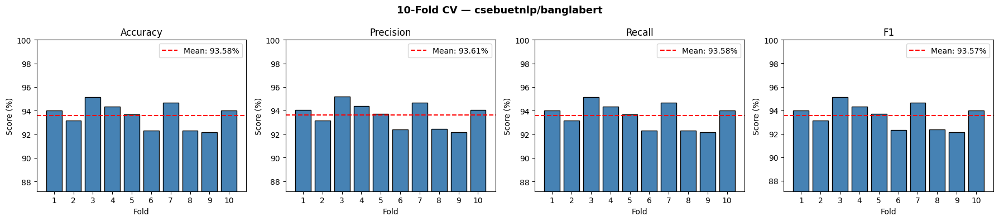

In [ ]:
metrics   = ['accuracy', 'precision', 'recall', 'f1']
fig, axes = plt.subplots(1, 4, figsize=(18, 4))

for ax, metric in zip(axes, metrics):
    vals = results_df[metric]
    ax.bar(results_df['fold'], vals, color='steelblue', edgecolor='black')
    ax.axhline(vals.mean(), color='red', linestyle='--',
               label=f'Mean: {vals.mean():.2f}%')
    ax.set_title(metric.capitalize())
    ax.set_xlabel('Fold')
    ax.set_ylabel('Score (%)')
    ax.set_xticks(results_df['fold'])
    ax.legend()
    ax.set_ylim(max(0, vals.min() - 5), 100)

plt.suptitle(f"{N_FOLDS}-Fold CV — {MODEL_NAME}", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f"cv_{N_FOLDS}fold_results.png", dpi=150)
plt.show()